In [1]:
using Distributions
using Plots
using MultivariateStats
using LinearAlgebra
import SpecialFunctions.erfc
import Statistics.std
using FileIO
using Feather
using DataFrames

# Financial Return Data

Source: Fagereng etal. (2016, AER P&P)

- average return
- s.d. return
- annual data: 1994 - 2013

In [2]:
mean_return = 
[0.034962971
0.033016693
0.033402823
0.027331134
0.036134217
0.040393546
0.043487873
0.041918445
0.037621688
0.02663671
0.017331908
0.024360182
0.021106459
0.031944051
0.038339201
0.017175036
0.021304199
0.024184169
0.024161763
0.027676426];

In [3]:
std_dev_return = 
[0.036463846
0.033065073
0.037798624
0.038744509
0.038689133
0.039843991
0.053244893
0.041973334
0.045639943
0.042901404
0.042556502
0.06061466
0.038314983
0.045965835
0.042857248
0.024834679
0.031804338
0.035859797
0.031907346
0.040183429];

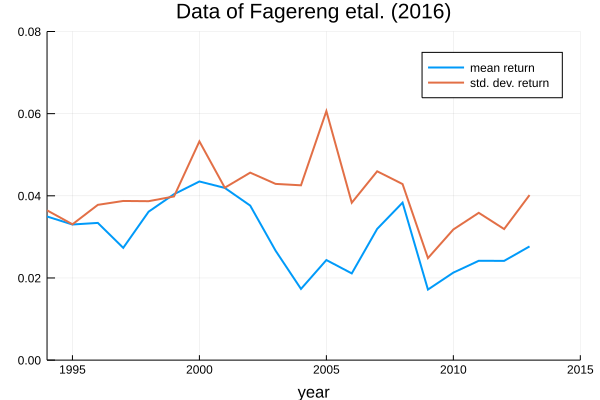

In [4]:
xx = 1994:1:2013  # time line

plot(xx, mean_return,
         title="Data of Fagereng etal. (2016)",
         label="mean return",
         xlabel="year",
         xlims=(1994, 2015),
         ylims=(0, 0.08),
         lw=2,
         legend=true)

plot!(xx, std_dev_return,
         label="std. dev. return",
         lw=2,
         legend=true)

## Transformation of Financial Return Data 

#### Consider the IID lognormal case:
> $\log R_t = \mu + \sigma \zeta_t$, $(\zeta_t) \sim iid N(0,1)$

Then 
- $ \mathbb{E} \, R = \exp(\mu + \sigma^2 / 2)$
- $ Var \, (R) = \mathbb{E} \, R^2 - (\mathbb{E} \, R)^2 
    = \exp (2 \mu + 2 \sigma^2) - \exp (2 \mu + \sigma^2)$

Compared with Figure 1 of Fagereng etal. (2016), 
- $\mathbb{E} \, R = $ average return $+ 1$
- $Var \, (R) = $ s.d. return$^2$
- annual data of average return and s.d. return : available (1994 - 2013)
- average return $ \approx 0.03$, $\;$ s.d. return $ \approx 0.04$

Simple calculation yields:
- $\mu = \log \left[ \frac{\mathbb{E} \, R}{\sqrt{\frac{Var \,(R)}{(\mathbb{E} \, R)^2} + 1}} \right]$
  $\quad$ and $\quad$
  $\sigma = \sqrt{ \log \left( \frac{Var \, (R)}{(\mathbb{E} \, R)^2} + 1 \right) }$

In [5]:
# transformation function 
function data_trans(data1::Real, data2::Real)
    μ = log((data1 + 1) / sqrt((data2^2) / ((data1 + 1)^2) + 1))
    σ = sqrt(log((data2^2) / ((data1 + 1)^2) + 1))
    return μ, σ
end

len = length(mean_return)
data = Array{Float64, 2}(undef, len, 2)

for i in 1:len
    data[i, 1], data[i, 2] = data_trans(mean_return[i], std_dev_return[i])
end

μ_ts, σ_ts = data[:, 1], data[:, 2]  # transformed data: time series (μ_t) and (σ_t)
stdev_μ_ts, stdev_σ_ts = std(μ_ts), std(σ_ts)  # std dev of transformed data

# reference mean and variance
μ_ref, σ_ref = data_trans(0.03, 0.04)

(0.02880529357487145, 0.038820321139140516)

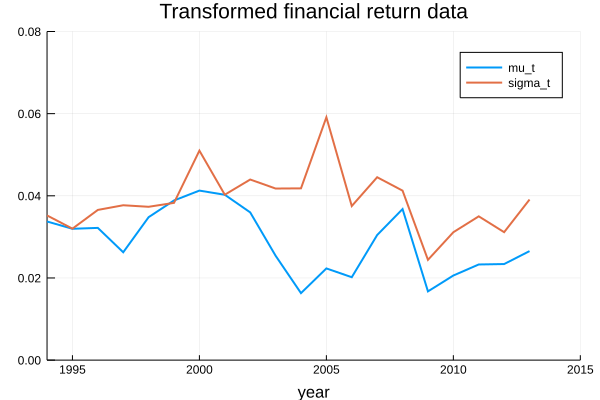

In [6]:
xx = 1994:1:2013

plot(xx, μ_ts,
         title="Transformed financial return data",
         label="mu_t",
         xlabel="year",
         xlims=(1994, 2015),
         ylims=(0, 0.08),
         lw=2,
         legend=true)

plot!(xx, σ_ts,
         label="sigma_t",
         lw=2,
         legend=true)

# Modelling Capital Income Risk


### Financial Return Process

> $\log R_t = \mu_t + \sigma_t \zeta_t$, 
$(\zeta_t) \sim iid N(0,1)$
- $(\mu_t)$, $(\sigma_t)$ : finite-state Markov chains

### Tauchen discretization: 
> $\mu_t = \bar{\mu} (1 - \rho_\mu) + \rho_\mu \mu_{t-1} 
    + \epsilon_t^\mu$, 
  $\, (\epsilon_t^\mu) \sim iid N(0, \delta_\mu^2)$ <br/>
> $\log \sigma_t = \bar{\sigma} (1 - \rho_\sigma) 
    + \rho_\sigma \log \sigma_{t-1} 
    + \epsilon_t^\sigma$,
  $\, (\epsilon_t^\sigma) \sim iid N(0, \delta_\sigma^2)$

### OLS Estimation Result:  $(\mu_t)$ process

> $\mu_t = \bar{\mu} (1 - \rho_\mu) + \rho_\mu \mu_{t-1} 
    + \epsilon_t^\mu$, 
  $\, (\epsilon_t^\mu) \sim iid N(0, 1)$ <br/>
  - $\bar{\mu} = 0.028100825548371282$
  - $\rho_\mu = 0.5721707316453398$
  - $\delta_\mu = 0.006659757215869284$

In [7]:
#= ------------------------------------------------------------ # 
  OLS estimation ： 
  ----------------
  μ_t = ̄μ(1-ρ_μ) + ρ_μ μ_{t-1} + ϵμ_t, {ϵμ_t} ~iid N(0, δ_μ^2)
# ------------------------------------------------------------- =#

# constructing data matrices
X = Array{Float64,2}(undef, length(μ_ts)-1, 2)
X[:,1] = ones(length(μ_ts) - 1)
X[:,2] = μ_ts[1:end-1]
Y = μ_ts[2:end]

# estimating ̃μ and ρ_μ
sol = (X' * X) \ (X' * Y)  # OLS regression, method 1
#sol2 = inv(X' * X) * X' * Y  # OLS regression, method 2
#sol3 = llsq(X, Y, bias=false)  # OLS regression, method 3

est1, est2 = sol  # estimated parameter values

μ_bar, ρ_μ = est1 / (1 - est2), est2

# estimating δ_μ by calculating the standard error
δ_μ = sqrt(sum((Y - X * sol).^2) / (length(Y) - 2)) 

μ_bar, ρ_μ, δ_μ 

# the standard deviation of the stationary distribution of {μ_t}
# stationary distribution N(μ_bar, est_stat_std_mu^2)
est_stat_std_mu = sqrt(δ_μ^2 / (1 - ρ_μ^2))

println("Estimation Result: ")
println("")
println("μ_bar : $μ_bar")
println("ρ_μ   : $ρ_μ")
println("δ_μ   : $δ_μ")
println("")
println("stationary std. dev. : $est_stat_std_mu")
println("")

Estimation Result: 

μ_bar : 0.028100825548371282
ρ_μ   : 0.5721707316453398
δ_μ   : 0.006659757215869284

stationary std. dev. : 0.008120322873665927



### OLS Estimation Result: $(\sigma_t)$ process 

$\log \sigma_t = \bar{\sigma} (1 - \rho_\sigma) 
    + \rho_\sigma \log \sigma_{t-1} 
    + \epsilon_t^\sigma$,
  $\, (\epsilon_t^\sigma) \sim iid N(0, \delta_\sigma^2)$
  - $\bar{\sigma} = -3.2556044264516704$
  - $\rho_\sigma = 0.2894534139396562 $
  - $\delta_\sigma = 0.18962151653401482$

In [8]:
#= ---------------------------------------------------------------- #
  OLS estimation: 
  ---------------
  log σ_t = ̄σ(1-ρ_σ) + ρ_σ log σ_{t-1} + ϵσ_t, {ϵσ_t} ~iid N(0, δ_σ^2)
# ---------------------------------------------------------------- =# 

# constructing data matrices
Xs = Array{Float64,2}(undef, length(σ_ts)-1, 2)
Xs[:,1] = ones(length(σ_ts) - 1)
Xs[:,2] = log.(σ_ts[1:end-1])
Ys = log.(σ_ts[2:end])

sol_σ = (Xs' * Xs) \ (Xs' * Ys)  # OLS regression, method 1
#sol_σ2 = inv(Xs' * Xs) * Xs' * Ys  # OLS regression, method 2
#sol_σ3 = llsq(Xs, Ys, bias=false)  # OLS regression, method 3

est1, est2 = sol_σ # estimated parameter values

σ_bar, ρ_σ = est1 / (1 - est2), est2

# estimating δ_σ by calculating the standard error
δ_σ = sqrt(sum((Ys - Xs * sol_σ).^2) / (length(Ys) - 2))

# statistics of the stationary distribution of {σ_t}
# stationary distribution : LN(σ_bar, est_stat_std_logσ^2)
est_stat_std_logσ = sqrt(δ_σ^2 / (1 - ρ_σ^2))

est_mean_stat_σ = exp(σ_bar + est_stat_std_logσ^2 / 2)

println("Estimation Result: ")
println("")
println("σ_bar : $σ_bar")
println("ρ_σ   : $ρ_σ")
println("δ_σ   : $δ_σ")
println("")
println("stationary std. dev of {log σ_t}  : $est_stat_std_logσ")
println("")
println("stationary mean of {σ_t}          : $est_mean_stat_σ")
println("")

Estimation Result: 

σ_bar : -3.2556044264516704
ρ_σ   : 0.2894534139396562
δ_σ   : 0.18962151653401482

stationary std. dev of {log σ_t}  : 0.19810183977854054

stationary mean of {σ_t}          : 0.03932156208539589



# Discretizing the Financial Return Process

In [9]:
#= ------------------------------------------------------------------------------------ #
   The next function is originally copied from the QuantEcon library.
 
   - original name: `tauchen`
 
   - URL:
     https://github.com/QuantEcon/QuantEcon.jl/blob/master/src/markov/markov_approx.jl
 
   - @author : Spencer Lyon <spencer.lyon@nyu.edu>
 
   - to facilitate our usage, we modified some details of the function.
  -------------------------------------------------------------------------------------- 
   Tauchen's (1996) method for approximating AR(1) process with finite markov chain.
   The process follows
 
      y_t = μ + ρ y_{t-1} + ϵ_t, {ϵ_t} ~iid N(0, σ^2).

   Inputs:
   -------
    - `N::Int64`:           number of points in markov process
    - `ρ::Real` :           persistence parameter in AR(1) process
    - `σ::Real` :           standard deviation of random component of AR(1) process
    - `μ::Real(0.0)` :      mean of AR(1) process
    - `n_std::Integer(3)` : the number of standard deviations to each side the process
                            should span
 
   Returns:
   --------
   - `Π::Matrix{Float64}` : the Markov transition Matrix 
   - `yy::Array{Float64}` : an array holding the state values

# ------------------------------------------------------------------------------------- =#
function tauchen_discr(N::Int64, ρ::Real, σ::Real, μ::Real=0.0, n_std::Integer=3)
    # the standard normal cdf
    #std_norm_cdf(x::T) where {T <: Real} = cdf(Normal(), x)
    #std_norm_cdf(x::Array{T}) where {T <: Real} = cdf.(Normal(), x)
    std_norm_cdf(x::T) where {T <: Real} = 0.5 * erfc(-x/sqrt(2))
    std_norm_cdf(x::Array{T}) where {T <: Real} = 0.5 .* erfc(-x./sqrt(2))
    
    # get discretized space
    a_bar = n_std * sqrt(σ^2 / (1 - ρ^2))   # distance from the center
    y = make_grid(-a_bar, a_bar, N, 1.0)    # create line space
    w = y[2] - y[1]                         # step size
    
    # get transition probability matrix
    Π = zeros(N, N)  # create empty space to store transition matrix values
    
    for row in 1:N
        # compute probability transition to boundary points p(i, 1) and p(i, N)
        Π[row, 1] = std_norm_cdf((y[1] + w / 2. - ρ * y[row]) / σ)
        Π[row, N] = 1 - std_norm_cdf((y[N] - w / 2 - ρ * y[row]) / σ)
        
        # fill in the middle columns
        for col in 2:(N-1)
            Π[row, col] = (std_norm_cdf((y[col] + w / 2 - ρ * y[row]) / σ) -
                           std_norm_cdf((y[col] - w / 2 - ρ * y[row]) / σ))
        end
    end
    
    Π = Π ./ sum(Π, dims=2)  # renormalize the matrix to avoid rounding errors
    yy = y .+ μ / (1 - ρ)  # center process around its mean (μ / (1 - ρ)) in new variable
    
    return Π, yy
end

#= ----------------------------------------------------------------- #
  Make Scaled Grid Points

  - grid points are more dense near the smallest grid point.
  - grid points are more sparse near the greatest grid point.

  Inputs:
  -------
  `x_min::Real` : the minimum grid point
  `x_max::Real` : the maximum grid point 
  `x_size::Int64` : the number of grid points to be created
  `x_scale::Real` : the scale parameter that controls the spreadness
# ------------------------------------------------------------------ =#
function make_grid(x_min::Real, x_max::Real, 
                   x_size::Int64, x_scale::Real)
    # create space to store grid points
    x_grid = Array{Float64}(undef, x_size)  
        
    # the gap between grid points 
    x_delta = (x_max - x_min) / ((x_size - 1)^x_scale)
    for i in 1:x_size
        x_grid[i] = x_min + x_delta * (i-1)^x_scale
    end 
    return x_grid
end

make_grid (generic function with 1 method)

# Verifying the Stability Conditions

### Define the matrices:

- $\mathsf{Z}_\mu := \{i_1, \cdots, i_M \}, 
   \quad 
   \mathsf{Z}_\sigma := \{ j_1, \cdots, j_N \}$
   
- $D_\mu := \text{diag} 
            \left(
                \text{e}^{i_1}, \cdots, \text{e}^{i_M} 
            \right), 
   \quad
   D_\sigma := \text{diag} 
               \left(
                   \text{e}^{\, j_1^2 / 2}, 
                   \cdots, 
                   \text{e}^{\, j_N^2 / 2} 
               \right)$
   
- $V_\mu := \left( 
                \text{e}^{(1 - \gamma) i_1}, 
                \cdots, 
                \text{e}^{(1 - \gamma) i_M} 
            \right)',
   \quad
   V_\sigma := \left( 
                   \text{e}^{(1 - \gamma)^2 j_1^2 / 2}, 
                   \cdots, 
                   \text{e}^{(1 - \gamma)^2 j_N^2 / 2} 
               \right)'$

### We need to verify:

\begin{equation}
    r(\Pi_\mu D_\mu) \cdot r(\Pi_\sigma D_\sigma) < 1 / \beta  
\end{equation}

\begin{equation}
    \text{max} \{ r(\Pi_\mu D_\mu) \cdot r(\Pi_\sigma D_\sigma), 1 \}
    < 
    \left(
         \beta \| \Pi_\mu V_\mu \| \cdot \| \Pi_\sigma V_\sigma \| 
    \right)^{-1 / \gamma}
\end{equation}

- where $r(A)$ is the spectral radius of $A$

## Case I. Constant $\{ \mu_t\}$ process

> $\log R_t = \mu + \sigma_t \zeta_t$, 
 $\, (\zeta_t) \sim iid N(0,1)$
 <br>
 $\log \sigma_t = \bar{\sigma} (1 - \rho_\sigma) 
    + \rho_\sigma \log \sigma_{t-1} 
    + \epsilon_t^\sigma$,
  $\, (\epsilon_t^\sigma) \sim iid N(0, \delta_\sigma^2)$
  
- $\mu$ is the mean of the stationary distribution of the general $\{\mu_t\}$ process defined above.

In [10]:
struct consumer_problem_const_mu{T <: Real}
    β::T      # discount factor
    γ::T      # coefficient of relative risk aversion
    
    μ::T      # mean parameter of the {R_t} process

    σ_bar::T  # constant drift of the AR(1) law of motion related to {σ_t} 
    ρ_σ::T    # autoregressive coefficient of the AR(1) law of motion related to {μ_t} 
    δ_σ::T    # standard deviation of the {ϵσ_t} process

    Π_σ::Matrix{Float64}  # probability trasition matrix related to {σ_t}
    Z_σ::Array{Float64}   # state space of the {σ_t} process
    N_σ::Int64            # number of states of the {σ_t} process
    
    G_R::T    # the long-run growth rate of {R_t}
              # the spectral radius of L_R = P_σ D_σ 
    
    lhs_cond1::T    # left hand side value of stability condition 1
    rhs_cond1::T    # right hand side value of stability condition 1
    lhs_cond2::T    # left hand side value of stability condition 2
    rhs_cond2::T    # right hand side value of stability condition 2
    
    cond1::Bool     # determine if stability condition 1 is verified or not
    cond2::Bool     # determine if stability condition 2 is verified or not
     
    verbose::Bool   # determine if print stability check results or not
end



function consumer_problem_const_mu(;β=0.95,
                                    γ=1.5,
                                  #------------------- 
                                    μ=0.0281,
                                  #------------------- 
                                    σ_bar=-3.2556,
                                    ρ_σ=0.2895,
                                    δ_σ=0.1896,
                                  #------------------- 
                                    N_σ=5,
                                    verbose=true)
    
    # discretize {σ_t} process using Tauchen's method
    Π_σ, Z_σ = tauchen_discr(N_σ, ρ_σ, δ_σ, σ_bar*(1-ρ_σ), 3)  # transition matrix, state space
    Z_σ = exp.(Z_σ)
    
    
    #= ------------------------------------------------------ #
                    Long-run Growth Rate of {R_t}
    # ------------------------------------------------------ =#
    D_R = Diagonal(exp.(μ .+ Z_σ.^2 ./ 2))
    
    if maximum(D_R) == Inf
        G_R = NaN
    else
        L_R = Π_σ * D_R
        G_R = maximum(abs.(eigvals(L_R)))
    end
    
    #= ------------------------------------------------------ #
                         Stability Test 
      -------------------------------------------------------- 
      The following two conditions need to be satisfied:
      
      Condition 1:
      ------------
        r(Π_μ D_μ) r(Π_σ D_σ) < 1/β
    
      Condition 2:
      ------------
        max{r(Π_μ D_μ) r(Π_σ D_σ), 1} 
          < (β \|Π_μ V_μ \| \|Π_σ V_σ \|)^{-1/γ}
      
      See section 5.1 of the working paper for more details
    # ------------------------------------------------------- =# 
    
    # create diagonal matrices
    D_μ = exp(μ) 
    D_σ = Diagonal(exp.(Z_σ.^2 ./ 2))
    
    # create column vectors 
    V_μ = exp((1 - γ) * μ)
    V_σ = exp.((1 - γ)^2 .* (Z_σ.^2) ./ 2)
    
    if max(maximum(D_σ), maximum(V_σ)) == Inf
        lhs_cond1, rhs_cond1, lhs_cond2, rhs_cond2 = NaN, 1/β, NaN, NaN
        cond1, cond2 = false, false
    else
        # matrix multiplictions for the next step
        ΠD_σ = Π_σ * D_σ
        ΠV_σ = Π_σ * V_σ
        
        # calculate the spectral radius
        sr_μ = D_μ                           # r(Π_μ D_μ)
        sr_σ = maximum(abs.(eigvals(ΠD_σ)))  # r(Π_σ D_σ)
        
        # calculate vector norms (supremum norm)
        nm_μ = V_μ                  # \| Π_μ V_μ \|
        nm_σ = maximum(abs.(ΠV_σ))  # \| Π_σ V_σ \|
        
        # verifying the first condition
        lhs_cond1 = sr_μ * sr_σ  # left hand side value
        rhs_cond1 = 1 / β        # right hand side value
        cond1 = (lhs_cond1 < rhs_cond1)
        
        # verifying the second condition
        lhs_cond2 = maximum((sr_μ * sr_σ, 1))   # left hand side value
        rhs_cond2 = (β * nm_μ * nm_σ)^(-1 / γ)  # right hand side value
        cond2 = (lhs_cond2 < rhs_cond2)
    end
    
    
    # Report the stability test result
    if verbose==true
        if cond1 == true && cond2 == true
            println("")
            println("Stability conditions are verified!")
            println("")
            println("G_R = $G_R")
            println("")
            println("Ready for the next step!")
            println("")
        else
            println("")
            println("Error!!!")
            println("")
            println("Stability conditions are violated!")
            println("")
            println("Adjust parameter values!")
            println("")
        end
    end
    
    consumer_problem_const_mu(β, γ, μ, σ_bar, ρ_σ, δ_σ, Π_σ, Z_σ, N_σ, G_R, 
                              lhs_cond1, rhs_cond1, lhs_cond2, rhs_cond2, 
                              cond1, cond2, verbose)
end

consumer_problem_const_mu

### Stability of a Single Parameter Class

In [11]:

# if using new parameters #
β = 0.95 
γ = 2.0
μ = 0.0281
σ_bar = -3.2556
ρ_σ = 0.2895 #0.99
δ_σ = 0.8 #1e-3 #0.1896
N_σ=7

ifp = consumer_problem_const_mu(β=β, γ=γ, μ=μ, σ_bar=σ_bar, 
                                ρ_σ=ρ_σ, δ_σ=δ_σ, N_σ=N_σ, 
                                verbose=true)


# if using default parameters #
#ifp = consumer_problem()

β, γ, μ, σ_bar, ρ_σ, δ_σ = ifp.β, ifp.γ, ifp.μ, ifp.σ_bar, ifp.ρ_σ, ifp.δ_σ

println("-----------------------")
println(" Key Parameter Values:")
println("-----------------------")
println(" β     : $β")
println(" γ     : $γ")
println(" μ     : $μ")
println(" σ_bar : $σ_bar")
println(" ρ_σ   : $ρ_σ")
println(" δ_σ   : $δ_σ")
println(" N_σ   : $N_σ")
println("-----------------------")


Stability conditions are verified!

G_R = 1.0319423629881737

Ready for the next step!

-----------------------
 Key Parameter Values:
-----------------------
 β     : 0.95
 γ     : 2.0
 μ     : 0.0281
 σ_bar : -3.2556
 ρ_σ   : 0.2895
 δ_σ   : 0.8
 N_σ   : 7
-----------------------


### Stability Range

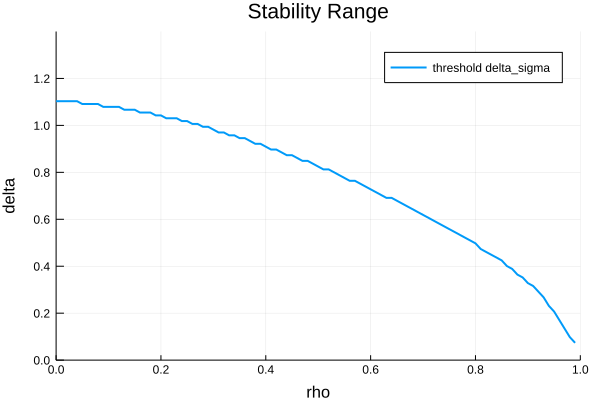

In [12]:
# Plotting stability range : (ρ_σ, δ_σ)

function stable_range_const_mu(; β::Real=0.95,
                         γ::Real=1.5,
                         μ::Real=0.0281,
                         ρ_σ_min::Real=0.0,
                         ρ_σ_max::Real=0.99,
                         ρ_σ_size::Int64=50,
                         δ_σ_min::Real=1e-3,
                         δ_σ_max::Real=1.2,
                         δ_σ_size::Int64=50)
    
    ρ_σ_grid = make_grid(ρ_σ_min, ρ_σ_max, ρ_σ_size, 1)
    δ_σ_grid = make_grid(δ_σ_min, δ_σ_max, δ_σ_size, 1)
    
    info_matrix = Array{Float64}(undef, ρ_σ_size, δ_σ_size)
    GR_matrix = Array{Float64}(undef, ρ_σ_size, δ_σ_size)
    for (i_ρ, ρ) in enumerate(ρ_σ_grid)
        for (i_σ, σ) in enumerate(δ_σ_grid)
            ifp = consumer_problem_const_mu(β=β, 
                                            γ=γ,
                                            μ=μ,
                                            ρ_σ=ρ, 
                                            δ_σ=σ, 
                                            verbose=false)
            GR_matrix[i_ρ, i_σ] = ifp.G_R
            if (ifp.cond1 == true) && (ifp.cond2 == true)
                info_matrix[i_ρ, i_σ] = 1.0
            else
                info_matrix[i_ρ, i_σ] = 0.0
            end
        end
    end
    return GR_matrix, info_matrix, ρ_σ_grid, δ_σ_grid
end


GR_matrix, info_matrix, ρ_σ_grid, δ_σ_grid = stable_range_const_mu(ρ_σ_size=100, δ_σ_size=100)

# find the threshod δ_σ values: the min values violating stability 
δ_σ_thresh = Array{Float64}(undef, length(ρ_σ_grid))  # create empty space to 
                                                      # store threshold δ_σ values
ff(t) = (t < 1.0)  # threshold criterion
for i in 1:length(ρ_σ_grid)
    index = findfirst(ff, info_matrix[i, :])
    δ_σ_thresh[i] = δ_σ_grid[index]
end


plot(ρ_σ_grid, δ_σ_thresh, 
     title="Stability Range", 
     xlabel="rho", 
     ylabel="delta", 
     label="threshold delta_sigma",
     xlim=(0.0, 1.0),
     ylim=(0.0, 1.4),
     #size=(500,500),
     lw=2, legend=true)

#savefig("stability_range.png")
#plot3d(ρ_σ_grid, δ_σ_grid, stable_range, xlabel="rho", ylabel="delta")       


In [13]:
GR_matrix

100×100 Array{Float64,2}:
 1.02926  1.02926  1.02926  1.02927  …    1.05174    1.05394    1.05646
 1.02926  1.02926  1.02926  1.02927       1.05178    1.05399    1.05652
 1.02926  1.02926  1.02926  1.02927       1.05185    1.05407    1.05661
 1.02926  1.02926  1.02926  1.02927       1.05194    1.05418    1.05674
 1.02926  1.02926  1.02926  1.02927       1.05205    1.05432    1.0569 
 1.02926  1.02926  1.02926  1.02927  …    1.0522     1.05448    1.05709
 1.02926  1.02926  1.02926  1.02927       1.05237    1.05468    1.05733
 1.02926  1.02926  1.02926  1.02927       1.05256    1.05491    1.0576 
 1.02926  1.02926  1.02926  1.02927       1.05279    1.05518    1.05791
 1.02926  1.02926  1.02926  1.02927       1.05305    1.05548    1.05827
 1.02926  1.02926  1.02926  1.02927  …    1.05334    1.05582    1.05867
 1.02926  1.02926  1.02926  1.02927       1.05367    1.05621    1.05912
 1.02926  1.02926  1.02926  1.02927       1.05404    1.05663    1.05963
 ⋮                                   ⋱

In [14]:
# adding a title row
top_column = [Symbol("data ", c) for c in 1:size(info_matrix)[2]]

# saving dataframe : info_matrix
info_matrix_const_mu = DataFrame(info_matrix, top_column)

# saving dataframe : GR_matrix
GR_matrix_const_mu = DataFrame(GR_matrix, top_column)

# saving dataframe : grid points
grid_const_mu = DataFrame(ρ_σ_grid = ρ_σ_grid, δ_σ_grid = δ_σ_grid)

#Feather.write("stab_range_info_const_mu.feather", info_matrix_const_mu)
#Feather.write("stab_range_GR_const_mu.feather", GR_matrix_const_mu)
#Feather.write("stab_range_grid_const_mu.feather", grid_const_mu)

,ρ_σ_grid,δ_σ_grid
1,0.0,0.001
2,0.01,0.0131111
3,0.02,0.0252222
4,0.03,0.0373333
5,0.04,0.0494444
6,0.05,0.0615556
7,0.06,0.0736667
8,0.07,0.0857778
9,0.08,0.0978889
10,0.09,0.11


## Case II: Constant $\{ \sigma_t \}$ Process

> $\log R_t = \mu_t + \sigma \zeta_t$, 
$(\zeta_t) \sim iid N(0,1)$ <br>

> $\mu_t = \bar{\mu} (1 - \rho_\mu) + \rho_\mu \mu_{t-1} 
    + \epsilon_t^\mu$, 
  $\, (\epsilon_t^\mu) \sim iid N(0, \delta_\mu^2)$
  
- $\sigma$: the stationary mean of the $\{\sigma_t\}$ process

In [15]:
struct consumer_problem_const_var{T <: Real}
    β::T      # discount factor
    γ::T      # coefficient of relative risk aversion
    
    σ::T      # std. dev. parameter of the {R_t} process

    μ_bar::T  # mean parameter of the AR(1) law of motion of {μ_t} 
    ρ_μ::T    # autoregressive coefficient of the AR(1) law of motion of {μ_t} 
    δ_μ::T    # standard deviation of the {ϵμ_t} process

    Π_μ::Matrix{Float64}  # probability trasition matrix related to {μ_t}
    Z_μ::Array{Float64}   # state space of the {μ_t} process
    N_μ::Int64            # number of states of the {μ_t} process
    
    G_R::T    # long-run growth rate of {R_t}
              # spectral radius of the matrix L_R = P D_R
    
    lhs_cond1::T    # left hand side value of stability condition 1
    rhs_cond1::T    # right hand side value of stability condition 1
    lhs_cond2::T    # left hand side value of stability condition 2
    rhs_cond2::T    # right hand side value of stability condition 2
    
    cond1::Bool     # determine if stability condition 1 is verified or not
    cond2::Bool     # determine if stability condition 2 is verified or not
     
    verbose::Bool   # determine if print stability check results or not
end



function consumer_problem_const_var(;β=0.95,
                           γ=1.5,
                        #------------------- 
                           σ=0.0393,
                        #------------------- 
                           μ_bar=0.0281,
                           ρ_μ=0.5722,
                           δ_μ=0.0067,
                        #------------------- 
                           N_μ=5,
                           verbose=true)
    
    # discretize {μ_t} process using Tauchen's method
    Π_μ, Z_μ = tauchen_discr(N_μ, ρ_μ, δ_μ, μ_bar*(1-ρ_μ), 3)  # transition matrix, state space
    
    #= ------------------------------------------------------ #
              Long-run Average Growth Rate of {R_t}
    -------------------------------------------------------- =#
    D_R = Diagonal(exp.(Z_μ .+ σ^2 / 2))
    L_R = Π_μ * D_R
    G_R = maximum(abs.(eigvals(L_R)))
    #=
    if maximum(D_R) == Inf
        G_R = NaN
    else
        L_R = Π_μ * D_R
        G_R = maximum(abs.(eigvals(L_R)))
    end
    =#
        
    #= ------------------------------------------------------ #
                         Stability Test 
      -------------------------------------------------------- 
      The following two conditions need to be satisfied:
      
      Condition 1:
      ------------
        r(Π_μ D_μ) r(Π_σ D_σ) < 1/β
    
      Condition 2:
      ------------
        max{r(Π_μ D_μ) r(Π_σ D_σ), 1} 
          < (β \|Π_μ V_μ \| \|Π_σ V_σ \|)^{-1/γ}
      
      See section 5.1 of the working paper for more details
    # ------------------------------------------------------- =# 
    
    # create diagonal matrices
    D_μ = Diagonal(exp.(Z_μ))
    D_σ = exp(σ^2 / 2)
    
    # create column vectors 
    V_μ = exp.((1 - γ) * Z_μ)
    V_σ = exp((1 - γ)^2 * σ^2 / 2)
      
    if max(maximum(D_μ), maximum(V_μ)) == Inf
        lhs_cond1, rhs_cond1, lhs_cond2, rhs_cond2 = NaN, 1/β, NaN, NaN
        cond1, cond2 = false, false
    else
        # matrix multiplictions for the next step
        ΠD_μ = Π_μ * D_μ
        ΠV_μ = Π_μ * V_μ
        
        # calculate the spectral radius
        sr_μ = maximum(abs.(eigvals(ΠD_μ)))  # r(Π_μ D_μ)
        sr_σ = D_σ                           # r(Π_σ D_σ)
        
        # calculate vector norms (supremum norm)
        nm_μ = maximum(abs.(ΠV_μ))   # \| Π_μ V_μ \|
        nm_σ = V_σ                   # \| Π_σ V_σ \|
        
        # verifying the first condition
        lhs_cond1 = sr_μ * sr_σ  # left hand side value
        rhs_cond1 = 1 / β        # right hand side value
        cond1 = (lhs_cond1 < rhs_cond1)
        
        # verifying the second condition
        lhs_cond2 = maximum((sr_μ * sr_σ, 1))   # left hand side value
        rhs_cond2 = (β * nm_μ * nm_σ)^(-1 / γ)  # right hand side value
        cond2 = (lhs_cond2 < rhs_cond2)
    end
    
    if verbose==true
        if cond1 == true && cond2 == true
            println("")
            println("Stability conditions are verified!")
            println("")
            println("G_R = $G_R")
            println("")
            println("Ready for the next step!")
            println("")
        else
            println("")
            println("Error!!!")
            println("")
            println("Stability conditions are violated!")
            println("")
            println("Adjust parameter values!")
            println("")
            println("G_R = $G_R")
            println("")
        end
    end
    
    consumer_problem_const_var(β, γ, σ, μ_bar, ρ_μ, δ_μ, Π_μ, Z_μ, N_μ, G_R, 
                             lhs_cond1, rhs_cond1, lhs_cond2, rhs_cond2, 
                             cond1, cond2, verbose)
end

consumer_problem_const_var

### Stability of a Single Parameter Class

In [16]:
# if using new parameters #
β = 0.95 
γ = 1.5
σ = 0.0393
μ_bar = 0.0281 #0.0281
ρ_μ = 0.0 #0.5772 #0.5722
δ_μ = 1e-3 #0.013 #0.0067
N_μ=5

ifp = consumer_problem_const_var(β=β, γ=γ, σ=σ, μ_bar=μ_bar, ρ_μ=ρ_μ, 
                                 δ_μ=δ_μ, N_μ=N_μ, verbose=true)

# if using default parameters #
#ifp = consumer_problem()

β, γ, σ, μ_bar, ρ_μ, δ_μ = ifp.β, ifp.γ, ifp.σ, ifp.μ_bar, ifp.ρ_μ, ifp.δ_μ

println("-----------------------")
println(" Key Parameter Values:")
println("-----------------------")
println(" β     : $β")
println(" γ     : $γ")
println(" σ     : $σ")
println(" μ_bar : $μ_bar")
println(" ρ_μ   : $ρ_μ")
println(" δ_μ   : $δ_μ")
println(" N_μ   : $N_μ")
println("-----------------------")


Stability conditions are verified!

G_R = 1.0292936985174204

Ready for the next step!

-----------------------
 Key Parameter Values:
-----------------------
 β     : 0.95
 γ     : 1.5
 σ     : 0.0393
 μ_bar : 0.0281
 ρ_μ   : 0.0
 δ_μ   : 0.001
 N_μ   : 5
-----------------------


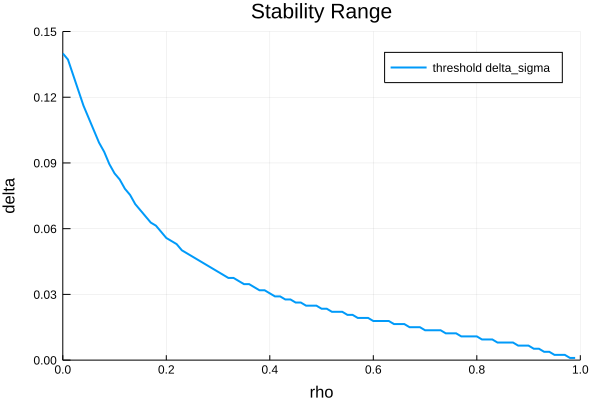

In [17]:
# Plotting stability range : (ρ_μ, δ_μ)
function stable_range_const_var(; β::Real=0.95,
                         γ::Real=1.5,
                         σ::Real=0.0393,
                         ρ_μ_min::Real=0.0,
                         ρ_μ_max::Real=0.99,
                         ρ_μ_size::Int64=50,
                         δ_μ_min::Real=1e-3,
                         δ_μ_max::Real=0.14,
                         δ_μ_size::Int64=50)
    
    ρ_μ_grid = make_grid(ρ_μ_min, ρ_μ_max, ρ_μ_size, 1)
    δ_μ_grid = make_grid(δ_μ_min, δ_μ_max, δ_μ_size, 1)
    
    GR_matrix = Array{Float64}(undef, ρ_μ_size, δ_μ_size)
    info_matrix = Array{Float64}(undef, ρ_μ_size, δ_μ_size)
    for (i_ρ, ρ) in enumerate(ρ_μ_grid)
        for (i_δ, δ) in enumerate(δ_μ_grid)
            ifpcv = consumer_problem_const_var(β=β, 
                                               γ=γ,
                                               σ=σ,
                                               ρ_μ=ρ, 
                                               δ_μ=δ, 
                                               verbose=false)
            GR_matrix[i_ρ, i_δ] = ifpcv.G_R
            if (ifpcv.cond1 == true) && (ifpcv.cond2 == true)
                info_matrix[i_ρ, i_δ] = 1.0
            else
                info_matrix[i_ρ, i_δ] = 0.0
            end
        end
    end
    return GR_matrix, info_matrix, ρ_μ_grid, δ_μ_grid
end

GR_matrix_2, info_matrix_2, ρ_μ_grid, δ_μ_grid = stable_range_const_var(ρ_μ_size=100, δ_μ_size=100)

# find the threshod δ_μ values: the min values violating stability 
δ_μ_thresh = Array{Float64}(undef, length(ρ_μ_grid))  # create empty space to 
                                                      # store threshold values
ff(t) = (t < 1.0)   # threshold criterion
for i in 1:length(ρ_μ_grid)
    index = findfirst(ff, info_matrix_2[i, :])
    if index == nothing
        δ_μ_thresh[i] = δ_μ_grid[length(ρ_μ_grid)]
    else
        δ_μ_thresh[i] = δ_μ_grid[index]
    end
end

# plot the stability thresholds: threshold δ_μ values
plot(ρ_μ_grid, δ_μ_thresh, 
     title="Stability Range", 
     xlabel="rho", 
     ylabel="delta", 
     label="threshold delta_sigma",
     xlim=(0.0, 1.0),
     ylim=(0.0, 0.15),
     #size=(500,500),
     lw=2, legend=true)

#savefig("stability_range.png")
#plot3d(ρ_σ_grid, δ_σ_grid, stable_range, xlabel="rho", ylabel="delta")       

In [18]:
GR_matrix_2
#contour(ρ_μ_grid_2, δ_μ_grid_2, GR_matrix_2)

100×100 Array{Float64,2}:
 1.02929  1.0293   1.0293   1.02931  1.02932  …   1.04083   1.04107   1.04131
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04107   1.04131   1.04156
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04131   1.04156   1.04181
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04156   1.04182   1.04207
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04182   1.04208   1.04234
 1.02929  1.0293   1.0293   1.02931  1.02932  …   1.04209   1.04236   1.04262
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04237   1.04264   1.04291
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04266   1.04293   1.04321
 1.02929  1.0293   1.0293   1.02931  1.02932      1.04295   1.04323   1.04352
 1.02929  1.0293   1.0293   1.02931  1.02933      1.04326   1.04355   1.04384
 1.02929  1.0293   1.0293   1.02931  1.02933  …   1.04358   1.04387   1.04417
 1.02929  1.0293   1.0293   1.02931  1.02933      1.04391   1.04421   1.04452
 1.02929  1.0293   1.0293   1.02931  1

In [19]:
# adding a title row
top_column = [Symbol("data ", c) for c in 1:size(info_matrix_2)[2]]

# saving dataframe : info_matrix
info_matrix_const_var = DataFrame(info_matrix_2, top_column)

# saving dataframe : GR_matrix
GR_matrix_const_var = DataFrame(GR_matrix_2, top_column)

# saving dataframe : grid points
grid_const_var = DataFrame(ρ_μ_grid = ρ_μ_grid, δ_μ_grid = δ_μ_grid)

#Feather.write("stab_range_info_const_var.feather", info_matrix_const_var)
#Feather.write("stab_range_GR_const_var.feather", GR_matrix_const_var)
#Feather.write("stab_range_grid_const_var.feather", grid_const_var)

,ρ_μ_grid,δ_μ_grid
1,0.0,0.001
2,0.01,0.00240404
3,0.02,0.00380808
4,0.03,0.00521212
5,0.04,0.00661616
6,0.05,0.0080202
7,0.06,0.00942424
8,0.07,0.0108283
9,0.08,0.0122323
10,0.09,0.0136364


## Random Discounting

- $\log \beta_{t+1} = (1 - \rho) \mu + \rho \log \beta_t + \epsilon_{t+1}$, $\{\epsilon_t \} \sim iid N(0, \sigma^2)$

- $\mu = -0.0836$, $\rho = 0.992$, $\sigma = 0.0021$

In [20]:
struct random_discounting{T <: Real}
    μ::T      # stationary mean of {β_t}
    ρ::T      # autocorrelation coefficient of {β_t}
    σ::T      # standard deviation of {β_t}

    Π_β::Matrix{Float64}  # probability trasition matrix related to {β_t}
    Z_β::Array{Float64}   # state space of {β_t} 
    N_β::Int64            # number of states of the {β_t} process
    
    G_β::T    # long-run average growth rate of {R_t}
end


function random_discounting(; μ=-0.0836, 
                              ρ=0.992,
                              σ=0.0021,
                              N_β=5)
    
    # discretize {β_t} process using Tauchen's method
    Π_β, Z_β = tauchen_discr(N_β, ρ, σ, μ*(1-ρ), 3)    # transition matrix, state space
    Z_β = exp.(Z_β)
    
    # evaluating the long-run average growth rate of {β_t}
    D_β = Π_β * Diagonal(Z_β)    # L_β = P D_β
    G_β = maximum(eigvals(D_β)) 
    
    random_discounting(μ, ρ, σ, Π_β, Z_β, N_β, G_β)
end

random_discounting

In [21]:
# Plotting stability range : (ρ_μ, δ_μ)
function contour_Gβ(; μ::Real=-0.0836,
                         ρ_min::Real=0.5,
                         ρ_max::Real=0.9999,
                         ρ_size::Int64=50,
                         σ_min::Real=0.0001,
                         σ_max::Real=0.1,
                         σ_size::Int64=50)
    
    ρ_grid = make_grid(ρ_min, ρ_max, ρ_size, 1)
    σ_grid = make_grid(σ_min, σ_max, σ_size, 1)
    
    Gβ_matrix = Array{Float64}(undef, ρ_size, σ_size)
    for (i_ρ, ρ) in enumerate(ρ_grid)
        for (i_σ, σ) in enumerate(σ_grid)
            cgb = random_discounting(μ=μ, ρ=ρ, σ=σ)
            Gβ_matrix[i_ρ, i_σ] = cgb.G_β
        end
    end
    
    return Gβ_matrix, ρ_grid, σ_grid
end

Gβ_matrix, ρ_grid, σ_grid = contour_Gβ(ρ_size=100, σ_size=100); 

In [22]:
Gβ_matrix

100×100 Array{Float64,2}:
 0.919799  0.919802  0.919809  …   0.94199     0.942455    0.942924 
 0.919799  0.919802  0.91981       0.942479    0.942954    0.943434 
 0.919799  0.919802  0.91981       0.942984    0.943469    0.94396  
 0.919799  0.919802  0.91981       0.943506    0.944003    0.944504 
 0.919799  0.919802  0.91981       0.944046    0.944554    0.945067 
 0.919799  0.919802  0.919811  …   0.944605    0.945124    0.94565  
 0.919799  0.919802  0.919811      0.945183    0.945715    0.946252 
 0.919799  0.919802  0.919811      0.945781    0.946326    0.946876 
 0.919799  0.919802  0.919811      0.946401    0.946959    0.947523 
 0.919799  0.919803  0.919812      0.947044    0.947615    0.948193 
 0.919799  0.919803  0.919812  …   0.94771     0.948296    0.948887 
 0.919799  0.919803  0.919812      0.948401    0.949001    0.949608 
 0.919799  0.919803  0.919813      0.949118    0.949733    0.950355 
 ⋮                             ⋱                                    
 0.91980

In [23]:
# adding a title row
top_column = [Symbol("data ", c) for c in 1:size(Gβ_matrix)[2]]

# saving dataframe : Gβ_matrix
Gβ_matrix = DataFrame(Gβ_matrix, top_column)

# saving dataframe : grid points
rho_grid = DataFrame(ρ_grid = ρ_grid)
sig_grid = DataFrame(σ_grid = σ_grid)

#Feather.write("Gβ_matrix.feather", Gβ_matrix)
#Feather.write("rho_grid.feather", rho_grid)
#Feather.write("sig_grid.feather", sig_grid)

"sig_grid.feather"